In [1]:
# Base
import matplotlib
import matplotlib.pyplot as plt
import torch
from torch import nn
import cv2
import numpy as np
import torchinfo

%load_ext autoreload
%autoreload 2

matplotlib.rcParams['figure.figsize'] = [15, 15]

In [2]:
# Funkcije
from generate_image import generate_image
from generate_noise import noise_add, noise_mul

#### Generiranje slik - Trikotniki

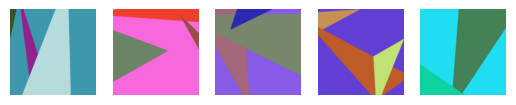

In [3]:
fig, ax_table = plt.subplots(1, 5)
for ax in ax_table.ravel():
    img = generate_image(256, 256, 3, 0, 0, 0)
    ax.imshow(img)
    ax.set_axis_off()

#### Generiranje slik - Štirikotniki

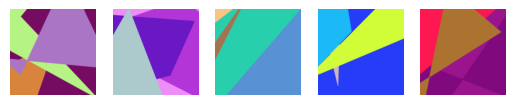

In [4]:
fig, ax_table = plt.subplots(1, 5)
for ax in ax_table.ravel():
    img = generate_image(256, 256, 0, 3, 0, 0)
    ax.imshow(img)
    ax.set_axis_off()

#### Generiranje slik - Elipse

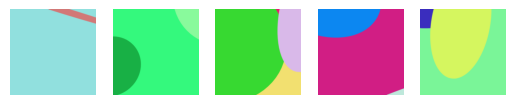

In [5]:
fig, ax_table = plt.subplots(1, 5)
for ax in ax_table.ravel():
    img = generate_image(256, 256, 0, 0, 3, 0)
    ax.imshow(img)
    ax.set_axis_off()

#### Generiranje slik - Zvezde

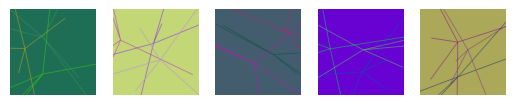

In [6]:
fig, ax_table = plt.subplots(1, 5)
for ax in ax_table.ravel():
    img = generate_image(256, 256, 0, 0, 0, 3)
    ax.imshow(img)
    ax.set_axis_off()

#### Učni primerki
Vsaka slik vsebuje po 5 likov vsakega tipa

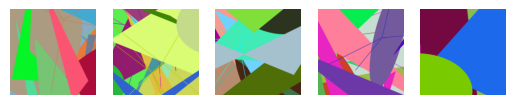

In [7]:
fig, ax_table = plt.subplots(1, 5)
for ax in ax_table.ravel():
    img = generate_image(256, 256, 5, 5, 5, 5)
    ax.imshow(img)
    ax.set_axis_off()

#### Generiranje šuma

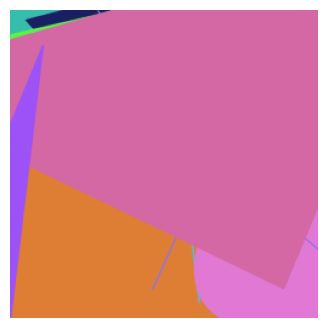

In [8]:
img = generate_image(256, 256, 5, 5, 5, 5)
plt.figure(figsize=[8, 4])
plt.imshow(img)
plt.axis('off')
plt.show()

#### Generiranje šuma - Aditivni šum

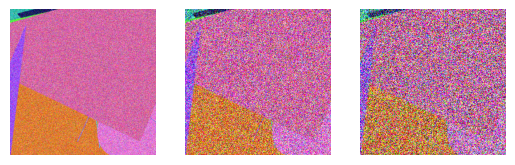

In [9]:
fig, ax_table = plt.subplots(1, 3)
for ax, std in zip(ax_table.ravel(), [0.1, 0.3, 0.5]):
    img_add = noise_add(img, std)
    ax.imshow(img_add)
    ax.set_axis_off()

#### Generiranje šuma - Multiplikativni šum

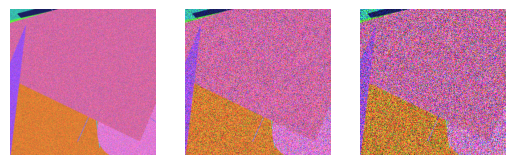

In [10]:
fig, ax_table = plt.subplots(1, 3)
for ax, std in zip(ax_table.ravel(), [0.1, 0.3, 0.5]):
    img_mul = noise_mul(img, std)
    ax.imshow(img_mul)
    ax.set_axis_off()

#### Nevronska mreža

Sloji nevronske mreže (urejen izpis iz torch):
* prva veja:
    * Conv2d(1, 8, kernel_size=(11, 11), padding=same)
* druga veja:
    *  ResNetBlock
        * Conv2d(3 (ali 32), 32, kernel_size=(3, 3), padding=same)
        * BatchNorm2d() ali Dropout2d()
        * ReLU()
        * Conv2d(32, 32, kernel_size=(3, 3), padding=same)
        * BatchNorm2d() ali Dropout2d()
        * Identity
        * ReLU()
    * ResNetBlock(...)
    * ResNetBlock(...)
    * Conv2d(32, 8, kernel_size=(1, 1), padding=same)
    * Softmax(dim=1)

In [3]:
# Nevronska mreža
from neural_network import *

In [4]:
# Model
model = EPSFilterNet(n_filts=8, resnet_filters=[32, 32, 32])

# Tukaj bi želeli videt eksperimentiranje z lr, funkcijo izgube in mogoče AdamW
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

noise_fn = noise_add # noise_add ali noise_mul
img_size = (256, 256)
model_file_name = f"model_{noise_fn.__name__}.pt"

print(torchinfo.summary(model, [1, 3, 256, 256]))

Layer (type:depth-idx)                   Output Shape              Param #
EPSFilterNet                             [1, 3, 256, 256]          --
├─Conv2d: 1-1                            [1, 8, 256, 256]          976
├─Conv2d: 1-2                            [1, 8, 256, 256]          (recursive)
├─Conv2d: 1-3                            [1, 8, 256, 256]          (recursive)
├─ResNetBlock: 1-4                       [1, 32, 256, 256]         --
│    └─Conv2d: 2-1                       [1, 32, 256, 256]         896
│    └─BatchNorm2d: 2-2                  [1, 32, 256, 256]         64
│    └─ReLU: 2-3                         [1, 32, 256, 256]         --
│    └─Conv2d: 2-4                       [1, 32, 256, 256]         9,248
│    └─BatchNorm2d: 2-5                  [1, 32, 256, 256]         64
│    └─Conv2d: 2-6                       [1, 32, 256, 256]         128
│    └─ReLU: 2-7                         [1, 32, 256, 256]         --
├─ResNetBlock: 1-5                       [1, 32, 256, 256]   

In [ ]:
# Učenje
epochs = 1000

model.to(device)
nn_train(model, optimizer, loss_fn, epochs, img_size, noise_fn)
torch.save(model, model_file_name)

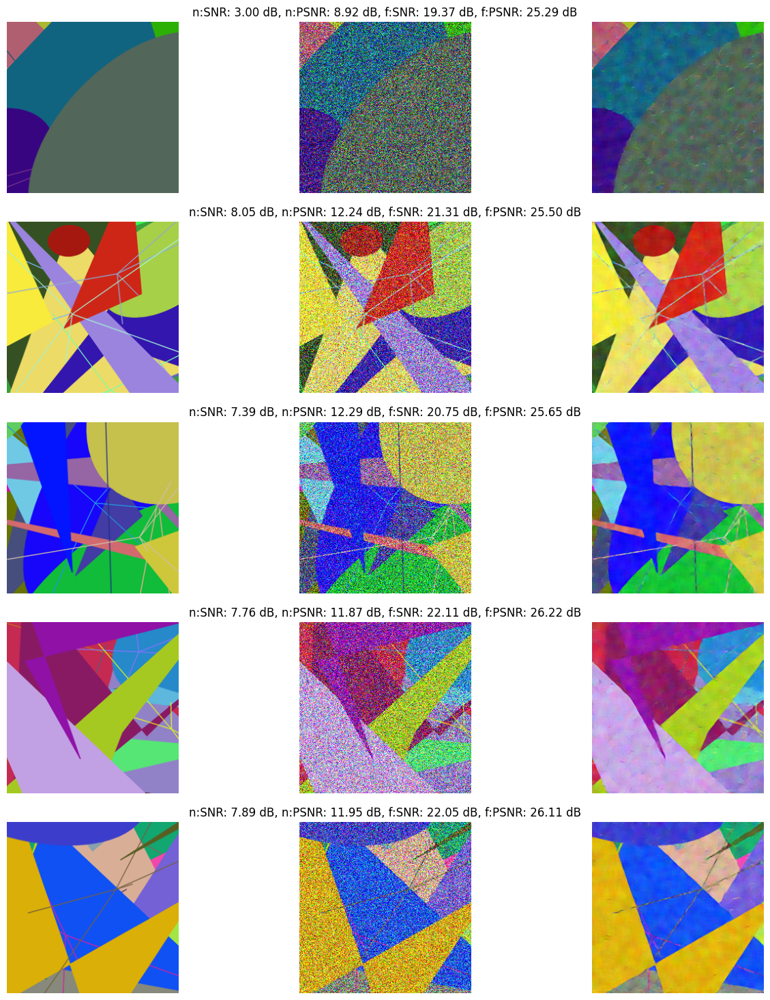

In [8]:
from matplotlib import pyplot

# Testiranje

# CUDA
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

model = torch.load(model_file_name, map_location=torch.device('cpu'), weights_only=False)
model.eval()
model.to(device)

num_of_tests = 5

fig, ax = pyplot.subplots(num_of_tests, 3, sharex=True, sharey=True)

for i in range(0, num_of_tests):
    img, img_noise, img_filt, snr_filt, psnr_filt, snr_noise, psnr_noise = nn_test(model, img_size, noise_fn)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(img_noise)
    ax[i, 2].imshow(img_filt)
    ax[i, 1].set_title(f"n:SNR: {snr_noise:.2f} dB, n:PSNR: {psnr_noise:.2f} dB, f:SNR: {snr_filt:.2f} dB, f:PSNR: {psnr_filt:.2f} dB")
    plt.tight_layout()

for ax in fig.get_axes():
    ax.set_axis_off()

#### Naučeni filtri mreže za odstranjevanje aditivnega šuma - naučeni na 100.000 epohah

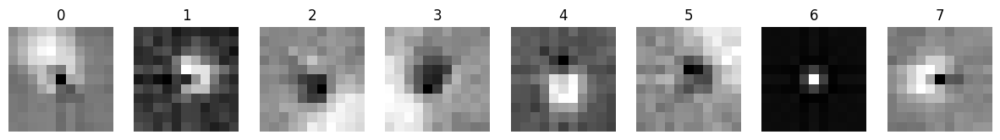

In [20]:
# Nalaganje modela
model = torch.load('model_add.pt', map_location=torch.device('cpu'))

# Izbira uteži filtrov
filters = model.filter_0.weight.detach().numpy()

N = filters.shape[0]
fig, ax = pyplot.subplots(1, N)
for n in range(N):
    ax[n].set_title(f'{n}')
    ax[n].imshow(filters[n, 0], cmap='gray')
    ax[n].set_axis_off()

- Filter 1 nima dobro definirane oblike. Mreža se torej ni naučila vseh filtrov, ki smo jih pričakovali.
- Filter 6 izbere samo središčni piksel.
- Preostali filtri računajo nekakšno lokalno povprečje iz rahlo različnih soseščin.

#### Naučeni filtri mreže za odstranjevanje multiplikativnega šuma - naučeni na 100.000 epohah

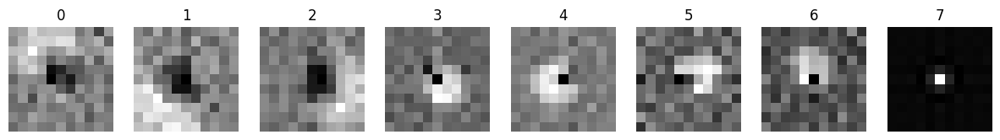

In [21]:
# Nalaganje modela
model = torch.load('model_mul.pt', map_location=torch.device('cpu'))

# Izbira uteži filtrov
filters = model.filter_0.weight.detach().numpy()

N = filters.shape[0]
fig, ax = pyplot.subplots(1, N)
for n in range(N):
    ax[n].set_title(f'{n}')
    ax[n].imshow(filters[n, 0], cmap='gray')
    ax[n].set_axis_off()

- Filtri za odstranjevanje multiplikativnega šuma so podobni kot filtri za odstranjevanje aditivnega.

#### Rezultati filtriranja - Aditivni šum

In [ ]:
# Ovrednotenje
iterations = 10

# Nalaganje modela
model_add = torch.load('model_add.pt', map_location=torch.device('cpu'))
model_add.eval()
model_add.to(device)
nn_eval(model_add, img_size, iterations, noise_fn)

#### Rezultati filtriranja - Multiplikativni šum

In [ ]:
# Ovrednotenje
iterations = 10

# Nalaganje modela
model_mul = torch.load('model_mul.pt', map_location=torch.device('cpu'))
model_mul.eval()
model_mul.to(device)
nn_eval(model_mul, img_size, iterations, noise_fn)

#### Slika 1 - Rezultati odstranjevanja aditivnega šuma na fotografijah

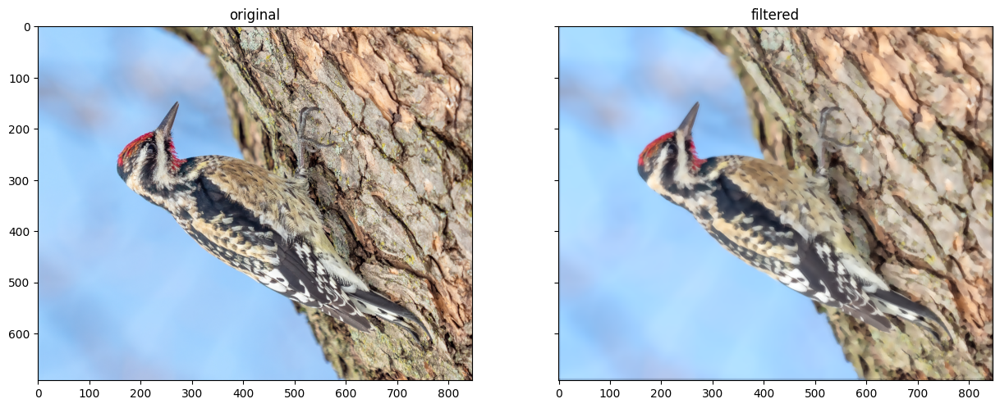

In [24]:
model_add = torch.load('model_add.pt', map_location=torch.device('cpu'))

# Nalaganje slike in skaliranje
img = pyplot.imread('./img1.jpg')
img = cv2.resize(img, None, fx=0.25, fy=0.25)

# Pretvorba in nalaganje v ustrezno napravo
img_tr = torch.from_numpy(np.float32(img/255.).transpose(2, 0, 1)[np.newaxis])

# Filtriranje z NM
pred_list = model_add(img_tr)

# Pretvorba ter omejitev vrednosti v sliki na veljaven interval
img_filt = pred_list[0].detach().numpy()[0].transpose(1, 2, 0)
img_filt = np.uint8(np.clip(img_filt, 0, 1)*255)

fig, ax_table = pyplot.subplots(1, 2, sharex=True, sharey=True)
for ax, s, t in zip(ax_table.ravel(), [img, img_filt], ['original', 'filtered']):
    ax.imshow(s)
    ax.set_title(t)

#### Uteži uporabljene za združevanje filtrov

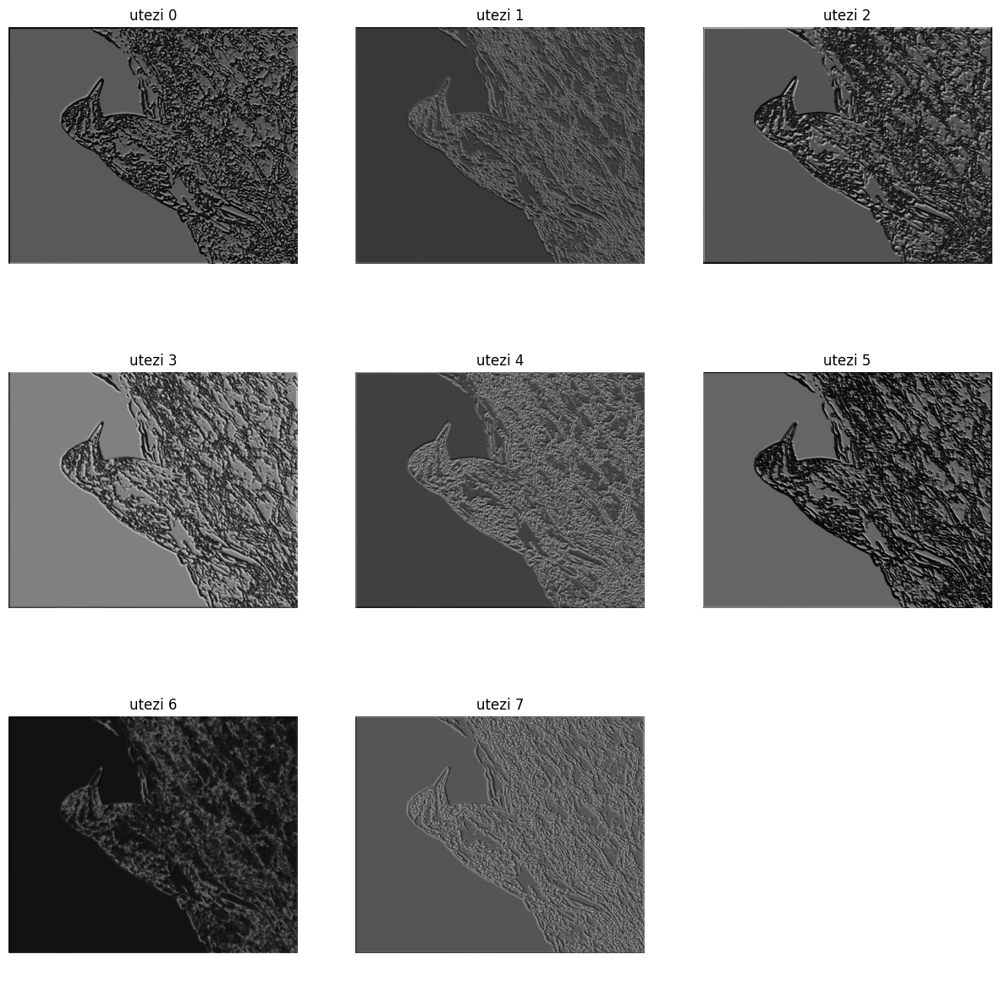

In [25]:
# Uteži
w = pred_list[1].detach().numpy()[0]

fig2, ax_table2 = pyplot.subplots(3, 3)
ax_table2 = ax_table2.ravel()
for n in range(w.shape[0]):
    ax_table2[n].imshow(w[n], cmap='gray')
    ax_table2[n].set_title(f'utezi {n}')
    ax_table2[n].set_axis_off()
    
ax_table2[8].set_axis_off()

- V sliki utezi 6 vidimo, da je filter 6 uporabljan predvsem na robovih slike.
- Na robovih mreza torej samo prepiše vrednost vhodnega piksla na izhod.

#### Podrobnosti

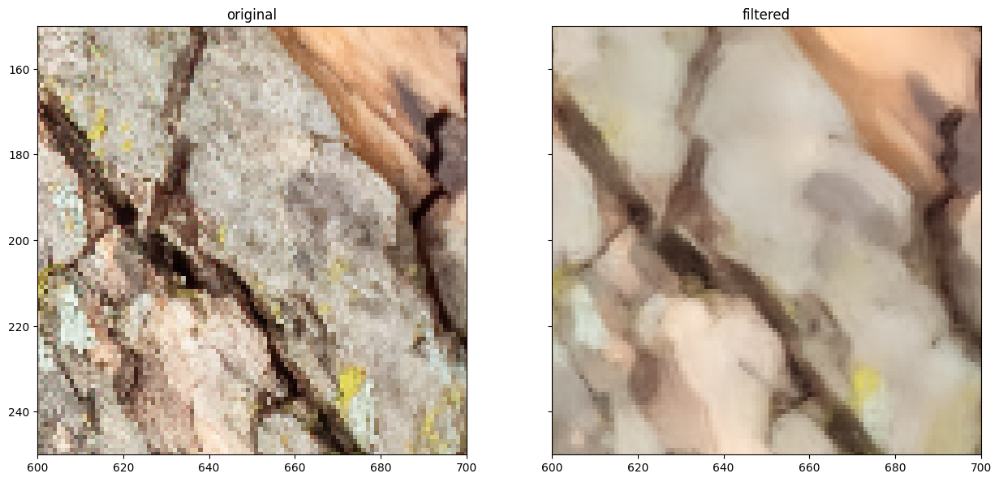

In [26]:
ax_table[0].set_xlim(600, 700)
ax_table[0].set_ylim(250, 150)
fig

- Na lubju je bilo odstranjenih dosti podrobnosti. Večji robovi pa so se ohranili.

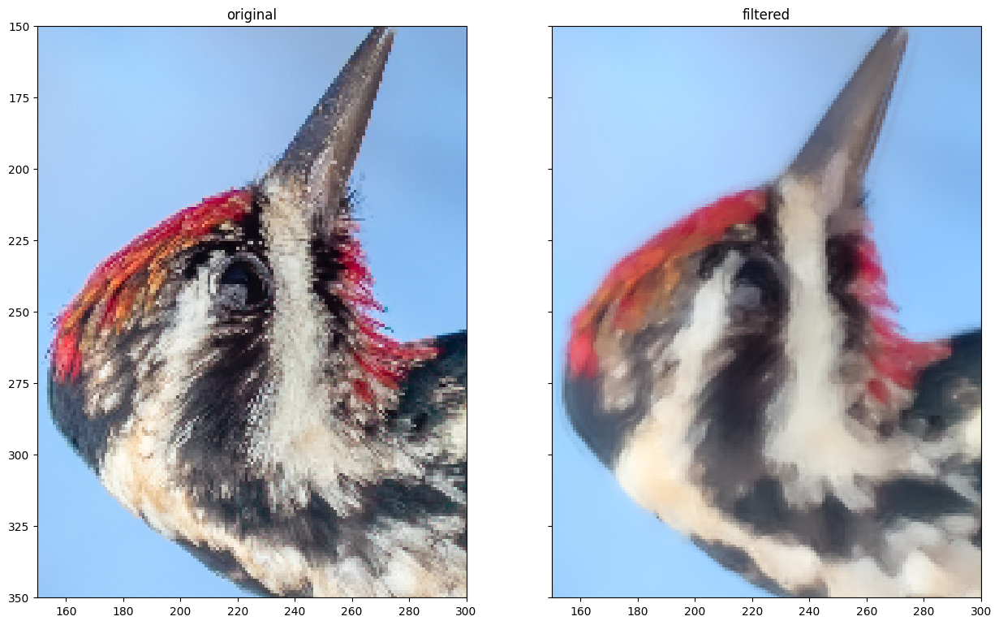

In [27]:
ax_table[0].set_xlim(150, 300)
ax_table[0].set_ylim(350, 150)
fig

- Glava ptice je dobro ohranjena, podrobnosti perja pa so bile izgubljene.

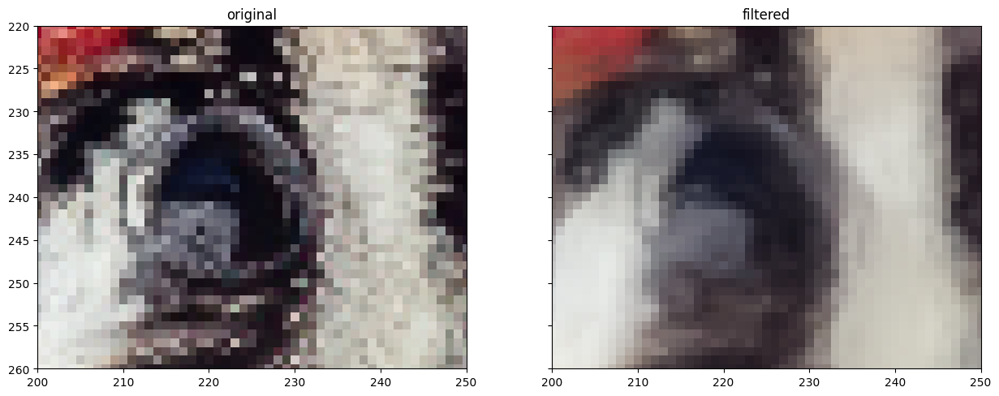

In [28]:
ax_table[0].set_xlim(200, 250)
ax_table[0].set_ylim(260, 220)
fig

#### Slika 2 - Rezultati odstranjevanja aditivnega šuma na fotografijah

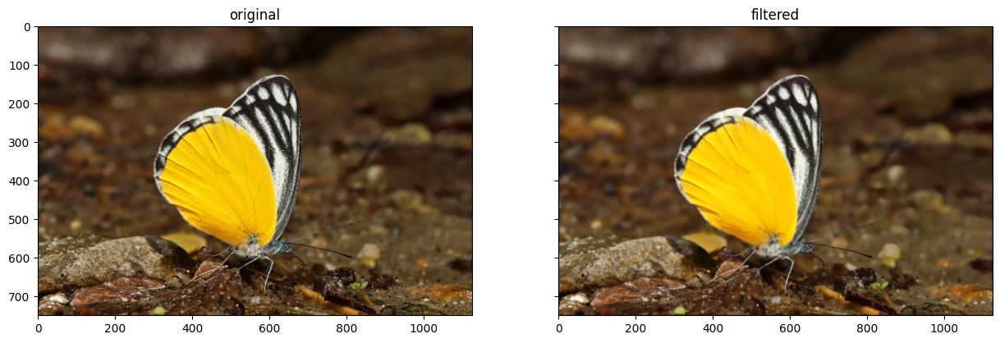

In [29]:
model_add = torch.load('model_add.pt', map_location=torch.device('cpu'))

# Nalaganje slike in skaliranje
img = pyplot.imread('./img2.jpg')
img = cv2.resize(img, None, fx=0.25, fy=0.25)

# Pretvorba in nalaganje v ustrezno napravo
img_tr = torch.from_numpy(np.float32(img/255.).transpose(2, 0, 1)[np.newaxis])

# Filtriranje z NM
pred_list = model_add(img_tr)

# Pretvorba ter omejitev vrednosti v sliki na veljaven interval
img_filt = pred_list[0].detach().numpy()[0].transpose(1, 2, 0)
img_filt = np.uint8(np.clip(img_filt, 0, 1)*255)

fig, ax_table = pyplot.subplots(1, 2, sharex=True, sharey=True)
for ax, s, t in zip(ax_table.ravel(), [img, img_filt], ['original', 'filtered']):
    ax.imshow(s)
    ax.set_title(t)

#### Uteži uporabljene za združevanje filtrov

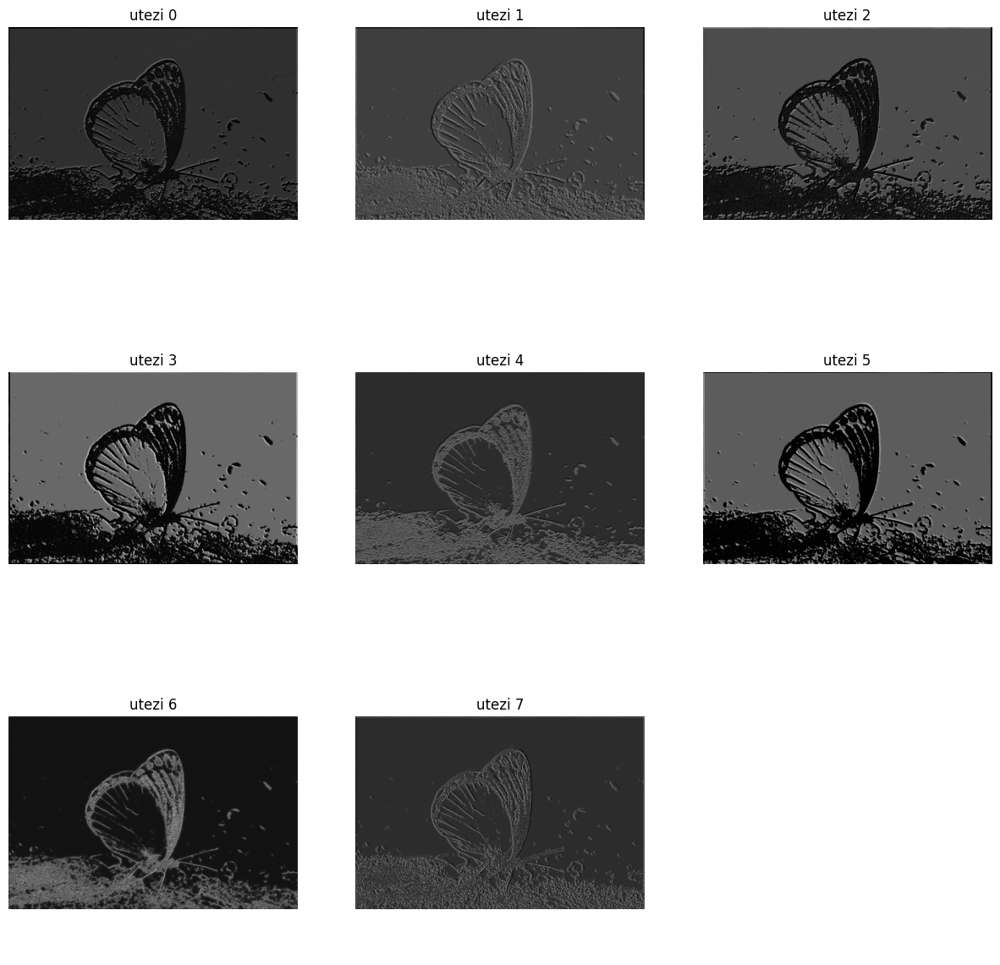

In [30]:
# Uteži
w = pred_list[1].detach().numpy()[0]

fig2, ax_table2 = pyplot.subplots(3, 3)
ax_table2 = ax_table2.ravel()
for n in range(w.shape[0]):
    ax_table2[n].imshow(w[n], cmap='gray')
    ax_table2[n].set_title(f'utezi {n}')
    ax_table2[n].set_axis_off()
    
ax_table2[8].set_axis_off()

#### Podrobnosti

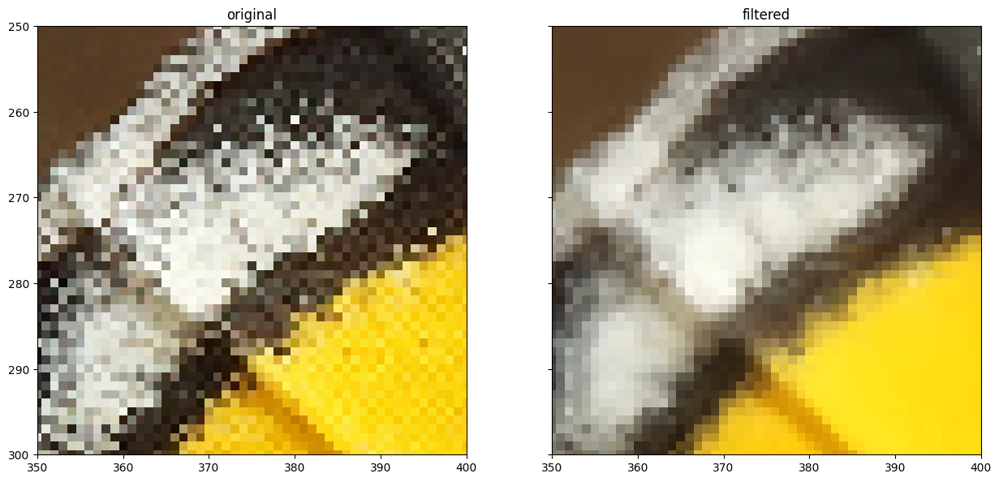

In [31]:
ax_table[0].set_xlim(350, 400)
ax_table[0].set_ylim(300, 250)
fig

- Krila metulja so izgubila dosti podrobnosti.

#### Slika 1 - Rezultati odstranjevanja multiplikativnega šuma na fotografijah

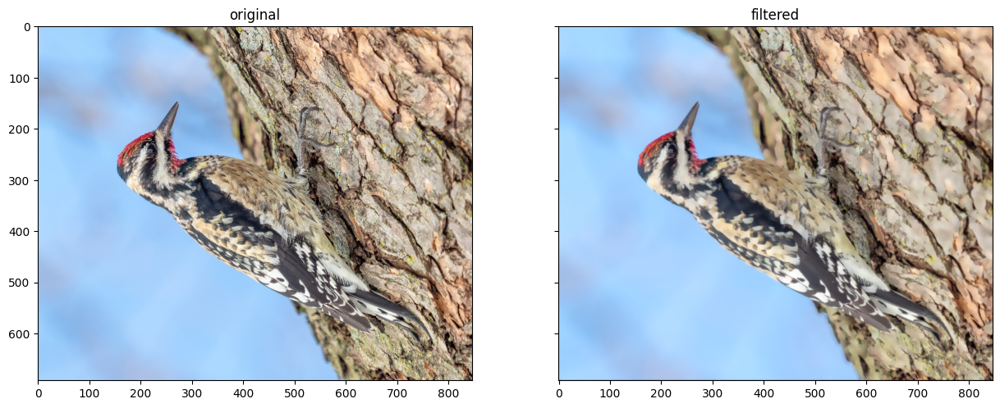

In [32]:
model_mul = torch.load('model_mul.pt', map_location=torch.device('cpu'))

# Nalaganje slike in skaliranje
img = pyplot.imread('./img1.jpg')
img = cv2.resize(img, None, fx=0.25, fy=0.25)

# Pretvorba in nalaganje v ustrezno napravo
img_tr = torch.from_numpy(np.float32(img/255.).transpose(2, 0, 1)[np.newaxis])

# Filtriranje z NM
pred_list = model_mul(img_tr)

# Pretvorba ter omejitev vrednosti v sliki na veljaven interval
img_filt = pred_list[0].detach().numpy()[0].transpose(1, 2, 0)
img_filt = np.uint8(np.clip(img_filt, 0, 1)*255)

fig, ax_table = pyplot.subplots(1, 2, sharex=True, sharey=True)
for ax, s, t in zip(ax_table.ravel(), [img, img_filt], ['original', 'filtered']):
    ax.imshow(s)
    ax.set_title(t)

#### Uteži uporabljene za združevanje filtrov

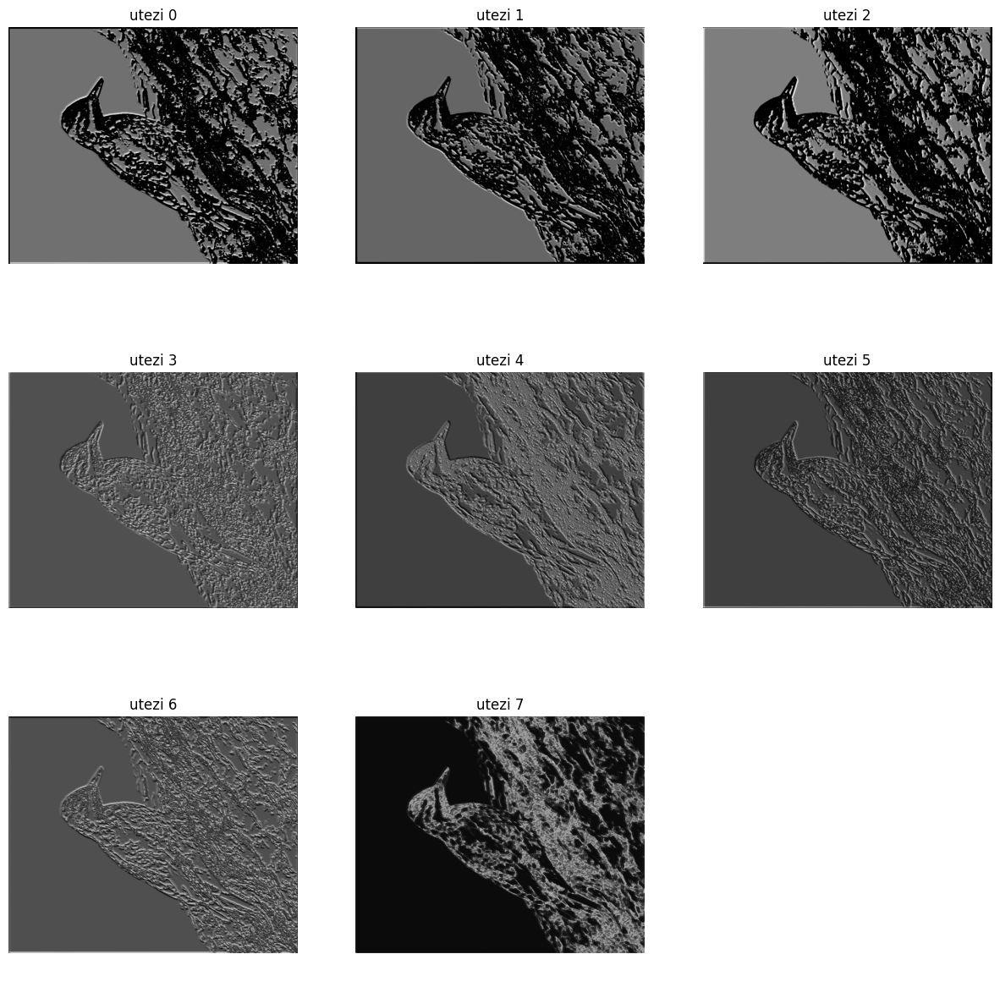

In [33]:
# Uteži
w = pred_list[1].detach().numpy()[0]

fig2, ax_table2 = pyplot.subplots(3, 3)
ax_table2 = ax_table2.ravel()
for n in range(w.shape[0]):
    ax_table2[n].imshow(w[n], cmap='gray')
    ax_table2[n].set_title(f'utezi {n}')
    ax_table2[n].set_axis_off()
    
ax_table2[8].set_axis_off()

- V sliki utezi 7 vidimo, da je filter 7 uporabljan predvsem na robovih slike.
- Na robovih mreza torej samo prepiše vrednost vhodnega piksla na izhod.

#### Podrobnosti

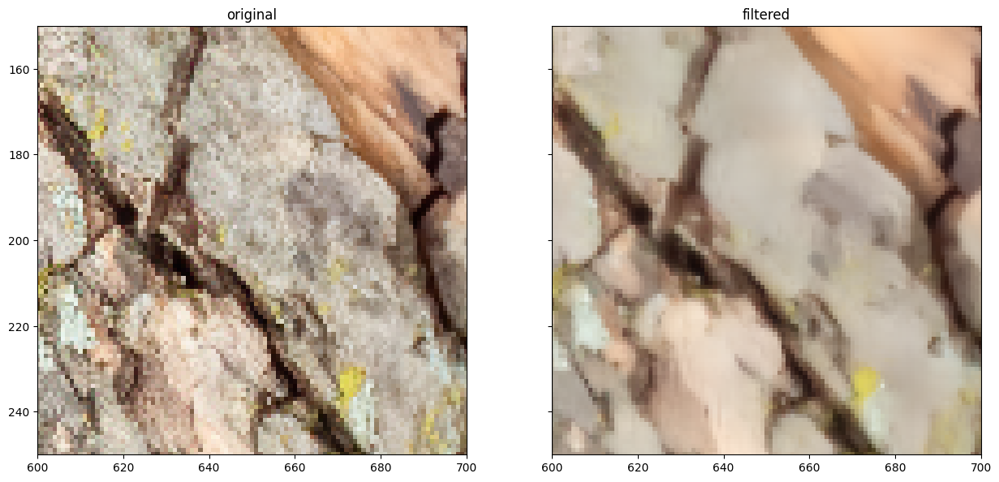

In [34]:
ax_table[0].set_xlim(600, 700)
ax_table[0].set_ylim(250, 150)
fig

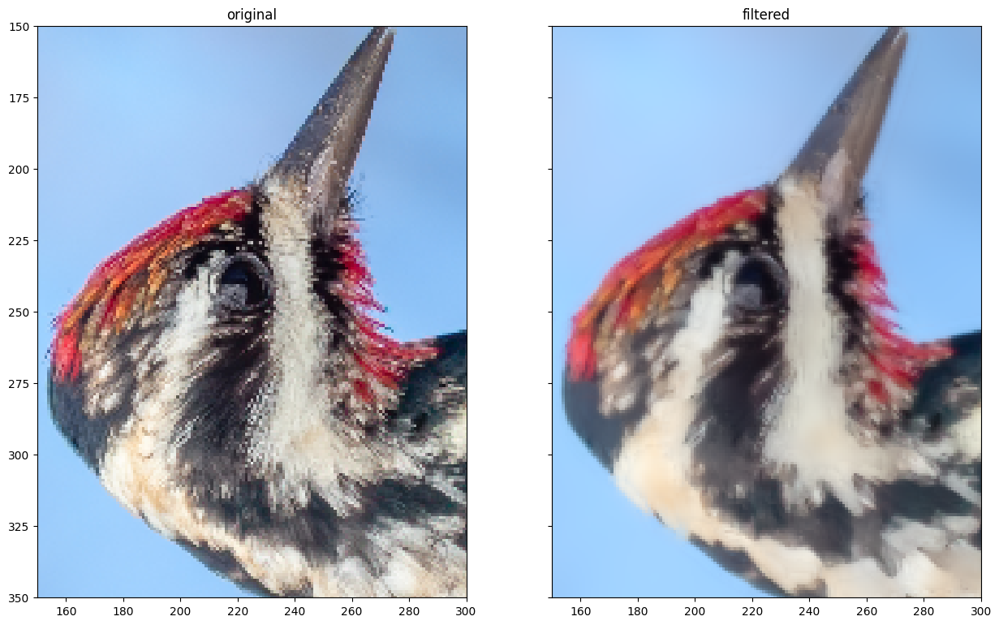

In [35]:
ax_table[0].set_xlim(150, 300)
ax_table[0].set_ylim(350, 150)
fig

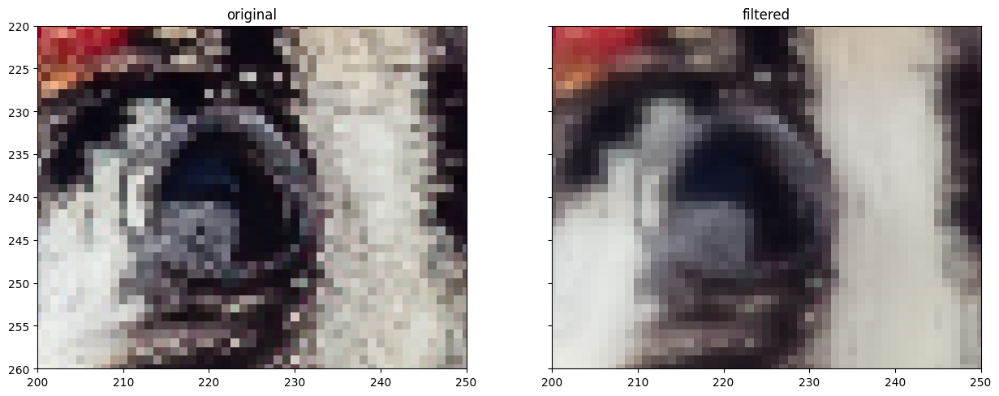

In [36]:
ax_table[0].set_xlim(200, 250)
ax_table[0].set_ylim(260, 220)
fig

#### Slika 2 - Rezultati odstranjevanja multiplikativnega šuma na fotografijah

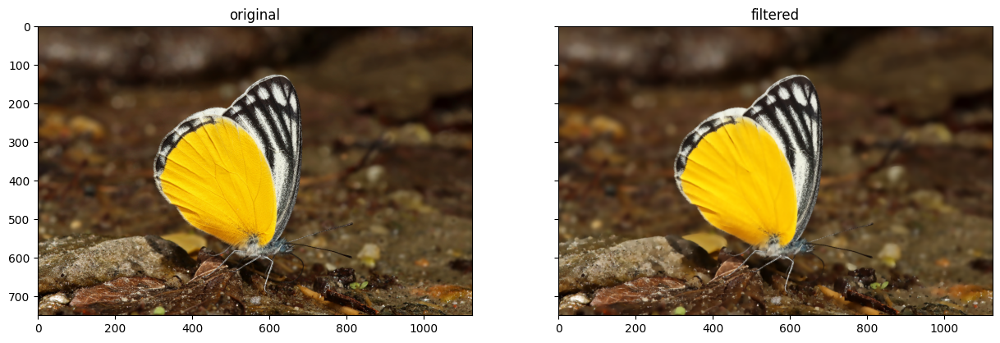

In [37]:
# Nalaganje slike in skaliranje
img = pyplot.imread('./img2.jpg')
img = cv2.resize(img, None, fx=0.25, fy=0.25)

# Pretvorba in nalaganje v ustrezno napravo
img_tr = torch.from_numpy(np.float32(img/255.).transpose(2, 0, 1)[np.newaxis])

# Filtriranje z NM
pred_list = model_mul(img_tr)

# Pretvorba ter omejitev vrednosti v sliki na veljaven interval
img_filt = pred_list[0].detach().numpy()[0].transpose(1, 2, 0)
img_filt = np.uint8(np.clip(img_filt, 0, 1)*255)

fig, ax_table = pyplot.subplots(1, 2, sharex=True, sharey=True)
for ax, s, t in zip(ax_table.ravel(), [img, img_filt], ['original', 'filtered']):
    ax.imshow(s)
    ax.set_title(t)

#### Uteži uporabljene za združevanje filtrov

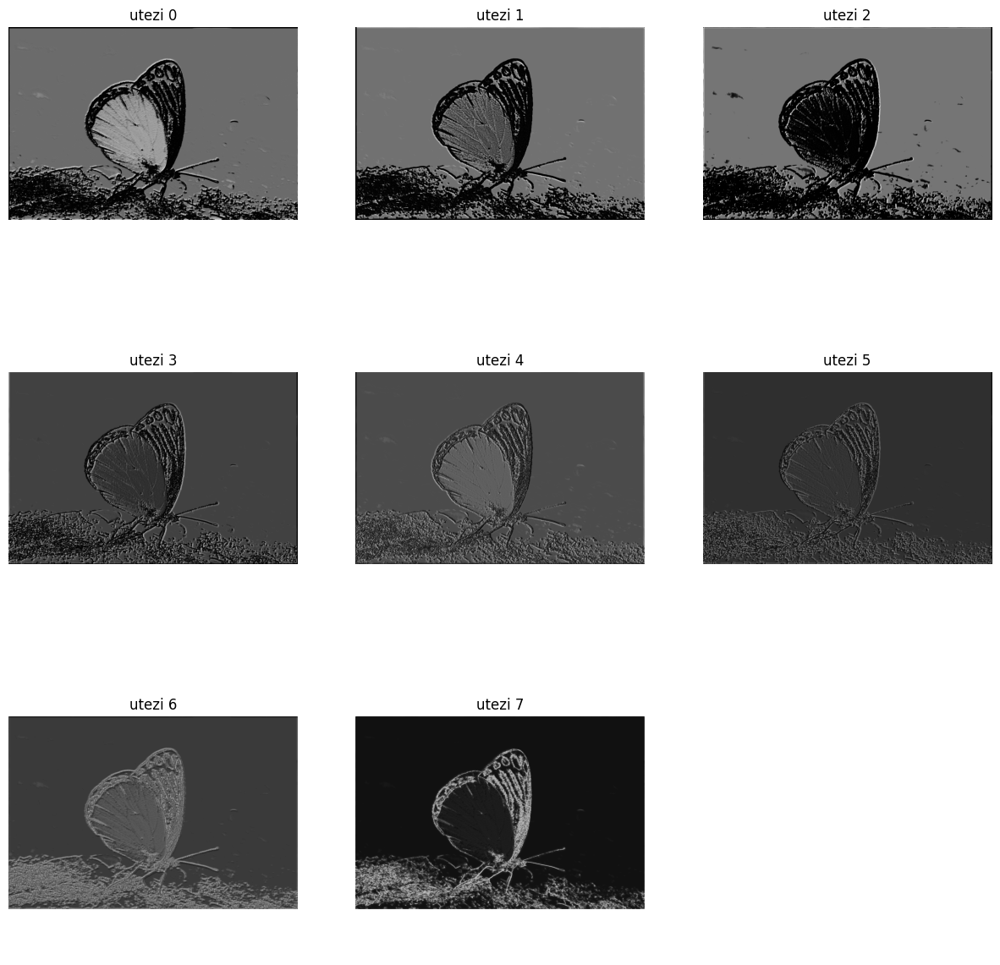

In [38]:
# Uteži
w = pred_list[1].detach().numpy()[0]

fig2, ax_table2 = pyplot.subplots(3, 3)
ax_table2 = ax_table2.ravel()
for n in range(w.shape[0]):
    ax_table2[n].imshow(w[n], cmap='gray')
    ax_table2[n].set_title(f'utezi {n}')
    ax_table2[n].set_axis_off()
    
ax_table2[8].set_axis_off()

#### Podrobnosti

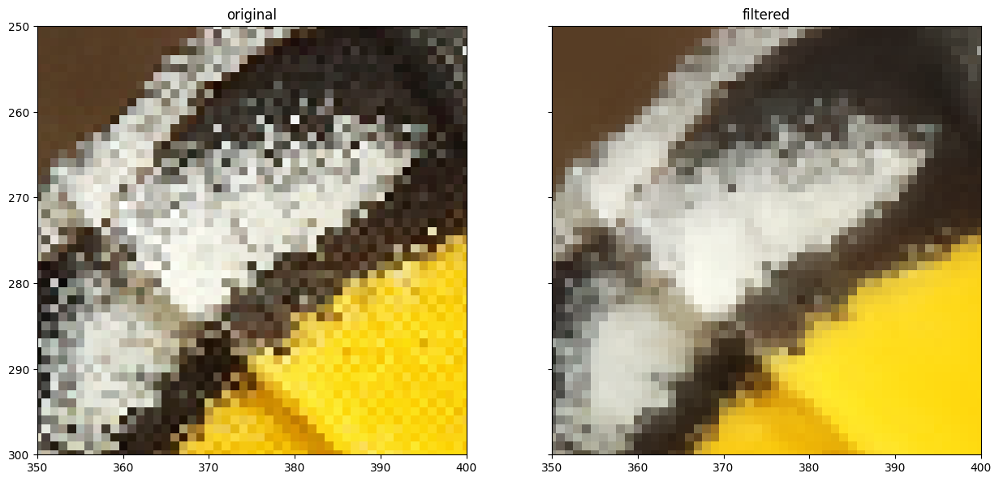

In [39]:
ax_table[0].set_xlim(350, 400)
ax_table[0].set_ylim(300, 250)
fig